# Set Paths and Files

In [1]:
import sys 
sys.path.append('..')

In [2]:
import os
import hashlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import SimpleITK as sitk
import random
import multiprocessing 
import time
from multiprocessing import Pool
multiprocessing.cpu_count()

import torch 
import time
import os, glob
from torch.utils.data import Dataset, DataLoader
%matplotlib inline

In [10]:
MODEL_TO_LOAD = 'boneseg3d_fn_0_nowin_elastdf_5lyr_model_epoch100'
MODEL_DIR = '/workspace/BoneSeg_all_128/models'
MODEL_PATH = os.path.join(MODEL_DIR, MODEL_TO_LOAD)
PATCH_SIZE = (128,128,128)

# BATCH_SIZE = 120
BATCH_SIZE = 4
NUM_WORKERS = 8

BASE_DIR = '/workspace/BoneMeta_all_128'
IMG_FOLDER_NAME = 'images'
LABEL_FOLDER_NAME = 'labels'
PRED_FOLDER_NAME = 'preds_seg'

USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")

In [11]:
PRED_DIR = os.path.join(BASE_DIR, PRED_FOLDER_NAME)
os.makedirs(PRED_DIR, exist_ok=True)
SAVING_DIR = os.path.join(PRED_DIR, MODEL_TO_LOAD)
os.makedirs(SAVING_DIR, exist_ok=True)
SAVING_DIR_NPY = os.path.join(SAVING_DIR, "numpy")
os.makedirs(SAVING_DIR_NPY, exist_ok=True)

In [12]:
IMG_DIR = os.path.join(BASE_DIR, IMG_FOLDER_NAME)
LABEL_DIR = os.path.join(BASE_DIR, LABEL_FOLDER_NAME)

IMG_FILES = os.listdir(IMG_DIR)
LABEL_FILES = os.listdir(LABEL_DIR)

def get_img_path(file): 
    return os.path.join(IMG_DIR, file)

def get_label_path(file):
    return os.path.join(LABEL_DIR, file)

def case_to_file(case):
    return case+'.npy'

def file_to_case(file_name):
    return file_name.split('.')[0]

set(IMG_FILES).issubset(LABEL_FILES)

True

In [13]:
print(IMG_DIR, len(IMG_FILES))
print(LABEL_DIR, len(LABEL_FILES))

/workspace/BoneMeta_all_128/images 317
/workspace/BoneMeta_all_128/labels 317


# Load Model

In [14]:
import logging
log = logging.getLogger("3DUnet")
# log.setLevel(logging.WARN)
log.setLevel(logging.INFO)
# log.setLevel(logging.DEBUG)

In [15]:
from torch.optim import SGD, AdamW, RMSprop
from torch import nn
from pytorch3dunet.unet3d.model import UNet3D, ResidualUNet3D

def initModel():    
#     segmentation_model = ResidualUNet3D(in_channels=3, out_channels=1, num_groups=32, f_maps=32, final_sigmoid=True, testing=True, num_levels=6)
    segmentation_model = ResidualUNet3D(in_channels=1, out_channels=1, num_groups=32, f_maps=32, final_sigmoid=True, testing=True, num_levels=5)
    # augmentation_model = SegmentationAugmentation(**self.augmentation_dict)

    if USE_CUDA:
        log.info("Using CUDA; {} devices.".format(torch.cuda.device_count()))
        if torch.cuda.device_count() > 1:
            segmentation_model = nn.DataParallel(segmentation_model)
            # augmentation_model = nn.DataParallel(augmentation_model)
        segmentation_model = segmentation_model.to(DEVICE)
        # augmentation_model = augmentation_model.to(DEVICE)

    return segmentation_model #, augmentation_model

def initOptimizer():
    return AdamW(segmentation_model.parameters(), lr=0.00005, weight_decay=0.00001)
    # return SGD(segmentation_model.parameters(), lr=0.001, momentum=0.99)

segmentation_model = initModel()
optimizer = initOptimizer()

# Load model
if MODEL_TO_LOAD :
  model_path = MODEL_PATH
  seg_dict = torch.load(model_path, map_location='cpu')
  if torch.cuda.device_count() > 1:
    segmentation_model.module.load_state_dict(seg_dict['model_state'])
  else:
    segmentation_model.load_state_dict(seg_dict['model_state'])

# Preprocess Images

In [16]:
import torch.nn.functional as F

# Pytorch 3D image tensor = Depth, Height, Weight
#w(l-> r), h(t->b), d(u->d) 순서로군

In [17]:
def predict_one_case(image_t, batch_size ,patch_size):
    with torch.no_grad():
        segmentation_model.eval()
        pred_label = segmentation_model(image_t[np.newaxis,np.newaxis,:].type(torch.float32))

    return pred_label[0][0].cpu()

In [18]:
def getDice(prediction_g, label_g, epsilon=1):
    diceLabel_g = label_g.sum(dim=[0,1,2])
    dicePrediction_g = prediction_g.sum(dim=[0,1,2])
    diceCorrect_g = (prediction_g * label_g).sum(dim=[0,1,2])

    diceRatio_g = (2 * diceCorrect_g + epsilon) \
        / (dicePrediction_g + diceLabel_g + epsilon)

    return diceRatio_g

In [19]:
def savePred(pred_t, filename):
    file_path = os.path.join(SAVING_DIR_NPY, filename)
    np.save(file_path, pred_t.numpy().astype(np.uint8))
    
def saveLog(log_string):
    with open(f'{SAVING_DIR}/log.txt', 'w') as f:
        f.write(log_string)

In [20]:
def doPrediction(files, batch_size, patch_size):
    dice_metric = np.zeros(len(files))
    log_text =''
    for i, file in enumerate(files):
        image = np.load(get_img_path(file))
        image_t = torch.tensor(image)
        label = np.load(get_label_path(file))
        label = label > 0.5 # 현재 label이 1,2,3 으로 마스킹이 다르게 되어있음
        
        pred = predict_one_case(image_t, batch_size, patch_size)
        pred_t = pred>0.5
        label_t = torch.tensor(label)
        
        dice = getDice(pred_t, label_t, epsilon=0.01)
        dice_sig = getDice(pred, label_t, epsilon=0.01)
        
        dice_metric[i] = dice
        
        log = f"""
Case: {file_to_case(file)}
    DICE = {dice}
    DICE with sigmoid = {dice_sig}
    """
        print(log)
        log_text = log_text + log
        savePred(pred_t, file)
        
    log = f'''
Average DICE score = {dice_metric.mean()}
Standard deviation = {dice_metric.std()}
DICE = {list(dice_metric)}
    '''
    log_text = log_text + log
    saveLog(log_text)
    print(log)
    return dice_metric

In [21]:
t = time.perf_counter()

dice = doPrediction(IMG_FILES, BATCH_SIZE, PATCH_SIZE)
    
elapsed_time = time.perf_counter() - t
print(f'Time consumed: {elapsed_time}s')




Case: BH001_20190501_Abdomen_&_pelvis_CT_(3D)
    DICE = 0.03961871564388275
    DICE with sigmoid = 0.03947744518518448
    

Case: 000362_20191214_Chest_CT_(contrast)
    DICE = 0.01540315616875887
    DICE with sigmoid = 0.015335909090936184
    

Case: BH010_20161101_Chest_CT_(contrast)_+_3D_(Breast_with_other_CT)
    DICE = 0.028478454798460007
    DICE with sigmoid = 0.0282193161547184
    

Case: BH005_20170707_Chest_CT_(contrast)_+_3D_(Breast_with_other_CT)
    DICE = 0.03264828398823738
    DICE with sigmoid = 0.032361362129449844
    

Case: 000269_20190325_CT_Abdomen+Pelvis_Dynamic_(contrast)
    DICE = 0.028546921908855438
    DICE with sigmoid = 0.028386356309056282
    

Case: BH099_20200806_Abdomen_&_pelvis_CT
    DICE = 0.05672106891870499
    DICE with sigmoid = 0.05645604059100151
    

Case: KH038_20210401_Chest(+)
    DICE = 0.0016446619993075728
    DICE with sigmoid = 0.0016215851064771414
    

Case: BH058_20180918_Chest_CT_(contrast)_+_3D
    DICE = 0.036538582


Case: BH021_20181001_Chest_CT_(contrast)_+_3D_(Chest_with_other_CT)
    DICE = 0.14048585295677185
    DICE with sigmoid = 0.14018957316875458
    

Case: BH066_20190525_Chest_CT_(contrast)_+_3D_(Chest_with_other_CT)
    DICE = 0.008900091983377934
    DICE with sigmoid = 0.008846498094499111
    

Case: BH120_20200304_Chest_CT_(contrast)_+_3D
    DICE = 0.003376649459823966
    DICE with sigmoid = 0.003319541923701763
    

Case: 000560_20210706_Chest_CT_(contrast)
    DICE = 0.006505316123366356
    DICE with sigmoid = 0.006479190196841955
    

Case: BH113_20170914_Liver_CT_(LC_or_CLD,_3D)
    DICE = 0.12632542848587036
    DICE with sigmoid = 0.12569671869277954
    

Case: BH027_20191001_Chest_CT_(Contrast)_+_3D(TS)
    DICE = 0.002368505112826824
    DICE with sigmoid = 0.0023523964919149876
    

Case: SN051_20170401_CT_Chest_+_3D_(contrast_NO_CM)
    DICE = 0.046253543347120285
    DICE with sigmoid = 0.045751601457595825
    

Case: 000193_20190114_Chest_CT_(contrast)
    DIC


Case: 000363_20191201_CT_Abdomen+Pelvis_Pre-Post_(contrast)
    DICE = 0.03286537155508995
    DICE with sigmoid = 0.032685015350580215
    

Case: BH101_20201109_Chest_CT_(Contrast)_+_3D(TS)
    DICE = 0.015832848846912384
    DICE with sigmoid = 0.015723930671811104
    

Case: 000010_20181214_CT_Abdomen+Pelvis_Dynamic_(contrast)
    DICE = 0.21010255813598633
    DICE with sigmoid = 0.20925971865653992
    

Case: BH114_20180920_GU_Kidney_&_bladder_CT_(3D)
    DICE = 0.015315474942326546
    DICE with sigmoid = 0.015227694995701313
    

Case: SN005_20191001_Abdomen^03_LIVER_(Adult)
    DICE = 0.11187732964754105
    DICE with sigmoid = 0.11144008487462997
    

Case: 000316_20190715_Spine^L_SPINE_(Adult)
    DICE = 0.011551469564437866
    DICE with sigmoid = 0.011455725878477097
    

Case: SN012_20150801_Abdomen^01_Abdomen_Pelvis_Chest_(Adult)
    DICE = 0.012643641792237759
    DICE with sigmoid = 0.012542146258056164
    

Case: BH002_20190701_Chest_CT_(Non_contrast)_+_3D
    


Case: BH022_20190101_Thorax^03_Chest_NON_(Adult)
    DICE = 0.01590893603861332
    DICE with sigmoid = 0.015766913071274757
    

Case: 000356_20191024_Chest_CT_(contrast)
    DICE = 0.0060363830998539925
    DICE with sigmoid = 0.0060234759002923965
    

Case: SN031_20160501_2-CT_Chest_Lung_cancer
    DICE = 0.03210088238120079
    DICE with sigmoid = 0.03155732527375221
    

Case: BH080_20181210_Abdomen_&_pelvis_CT_(3D)
    DICE = 0.08097127079963684
    DICE with sigmoid = 0.0805148109793663
    

Case: 000435_20200401_CT_Abdomen+Pelvis_Dynamic_(contrast)
    DICE = 0.05384586378931999
    DICE with sigmoid = 0.05363737419247627
    

Case: BH116_20180606_GU_Abdomen_&_pelvis_CT_(3D)
    DICE = 0.004813075996935368
    DICE with sigmoid = 0.004788460675626993
    

Case: KH032_20210701_Chest(+)
    DICE = 0.012427393347024918
    DICE with sigmoid = 0.012319198809564114
    

Case: BH104_20161219_Chest_CT_(contrast)_+_3D_(Chest_with_other_CT)
    DICE = 0.027389422059059143
    D


Case: BH040_20200101_CT_Angio_+_3D_Pulmonary_artery_(Embolism)
    DICE = 0.033560656011104584
    DICE with sigmoid = 0.03335770219564438
    

Case: 000301_20190827_Chest_CT_(contrast)
    DICE = 0.178047314286232
    DICE with sigmoid = 0.17781956493854523
    

Case: 000466_20210125_Chest_CT_(contrast)
    DICE = 0.05798454210162163
    DICE with sigmoid = 0.05757199972867966
    

Case: BH106_20200613_Abdomen_&_pelvis_CT_(3D)
    DICE = 0.06306162476539612
    DICE with sigmoid = 0.0627186968922615
    

Case: BH121_20200301_Chest_CT_(contrast)_+_3D_(Chest_with_other_CT)
    DICE = 0.026227528229355812
    DICE with sigmoid = 0.02597985416650772
    

Case: 000019_20190601_CT_Abdomen+Pelvis_Dynamic_(contrast)
    DICE = 0.16720643639564514
    DICE with sigmoid = 0.166134774684906
    

Case: KH010_20201201_Chest(+)
    DICE = 0.02631290629506111
    DICE with sigmoid = 0.026215458288788795
    

Case: 000232_20190423_Chest_CT_(contrast)
    DICE = 0.11163335293531418
    DICE wi


Case: BH120_20200406_Abdomen_&_pelvis_CT_(3D)
    DICE = 0.006782148033380508
    DICE with sigmoid = 0.006752400659024715
    

Average DICE score = 0.054771700696777316
Standard deviation = 0.05950898181690329
DICE = [0.03961871564388275, 0.01540315616875887, 0.028478454798460007, 0.03264828398823738, 0.028546921908855438, 0.05672106891870499, 0.0016446619993075728, 0.03653858229517937, 0.024344217032194138, 0.09627334773540497, 0.021168392151594162, 0.014957306906580925, 0.0015125480713322759, 0.05219171568751335, 0.05976628512144089, 0.012664010748267174, 0.057860370725393295, 0.010850196704268456, 0.07220924645662308, 0.041016094386577606, 0.20464573800563812, 0.012151400558650494, 0.06509333848953247, 0.1693650186061859, 0.024425014853477478, 0.04921797662973404, 0.021648315712809563, 0.002142983488738537, 0.043329186737537384, 0.013365027494728565, 0.016996199265122414, 0.03984704613685608, 0.006389295682311058, 0.06347677856683731, 0.24670188128948212, 0.04619704931974411, 0.0

In [17]:
plt.hist(dice)

(array([149.,  86.,  28.,  23.,  11.,   7.,   5.,   4.,   1.,   3.]),
 array([0.00046391, 0.03335378, 0.06624365, 0.09913352, 0.1320234 ,
        0.16491327, 0.19780314, 0.23069301, 0.26358289, 0.29647276,
        0.32936263]),
 <BarContainer object of 10 artists>)

In [18]:
np.mean(dice)

0.05477170084220466

# Show an Example

In [22]:
import matplotlib.pyplot as plt

def slice_img(img, offset, end, interval):
  if end is None:
    end = len(img)
  else: 
    if end > len(img): 
      end = len(img)
    if end <= offset:
      end = offset + 1
  return img[offset:end:interval]

def show_numpy_img(np_img, offset=0, end=None, interval=5, title=''): 
  sliced_img = slice_img(np_img, offset, end, interval)

  figsize_per_img = 3
  num_col = 5
  num_row = int(np.ceil(sliced_img.shape[0] / num_col))
  # fig, axs = plt.subplots(num_row, num_col, figsize = (figsize_per_img*num_col, figsize_per_img*num_row))
  plt.figure(figsize=(figsize_per_img*num_col, figsize_per_img*num_row))
  for i, img in enumerate(sliced_img):
    if i >= num_col*num_row:
      continue
    # axs[i].imshow(img)
    plt.subplot(num_row, num_col, i+1)
    plt.imshow(img, 'gray')
    # plt.title()
  plt.suptitle(title)
  plt.tight_layout()
  plt.show()

#npy image 정보 보여주기 
def show_img_info(np_img):
  print('Shape:', np_img.shape)
  print('DType:', np_img.dtype)
  print('Max:', np_img.max())
  print('Min:', np_img.min())
  print(np_img)


#npy image, npy label 
def plot_img_and_label(np_img, label, interval = 5, offset = 0, end=None, figsize_per_image = 5):
  sliced_img = slice_img(np_img, offset, end, interval)
  sliced_label = slice_img(label, offset, end, interval)
  
  num_row = len(sliced_img)
  num_col = 2

  plt.figure(figsize=(figsize_per_image*num_col, figsize_per_image*num_row))

  for i in range(0, num_row):
    plt.subplot(num_row, num_col, i*num_col+1)
    tissue_image = sliced_img[i]
    plt.imshow(tissue_image, 'gray')

    plt.subplot(num_row, num_col, i*num_col+2)
    mask = sliced_label[i]
    label_on_tissue = sitk.LabelMapContourOverlay(sitk.Cast(sitk.GetImageFromArray(mask), sitk.sitkLabelUInt8), sitk.GetImageFromArray(tissue_image), opacity=0.7, contourThickness=[2,2], colormap=(0,255,0))
    plt.imshow(sitk.GetArrayFromImage(label_on_tissue), 'gray')

  plt.tight_layout()
  plt.show()
    
def adjust_window(image, window):
    width = window[0]
    level = window[1]
    upper = level+width/2
    lower = level-width/2
    copied_image = image.clip(lower, upper)
    copied_image = copied_image-lower
    return (copied_image/(upper-lower))

In [23]:
def plot_img_label_pred(image_npy, label_npy, pred_npy, interval = 5, offset = 0, end=None, figsize_per_image = 5, show_only_positive = False):
    sliced_img = slice_img(image_npy, offset, end, interval)
    sliced_label = slice_img(label_npy, offset, end, interval)
    sliced_pred = slice_img(pred_npy, offset, end, interval)

    if show_only_positive:
        positive_idx = (sliced_label + sliced_pred).sum(axis = (1,2)) > 0.5
        sliced_img = sliced_img[positive_idx]
        sliced_label = sliced_label[positive_idx]
        sliced_pred = sliced_pred[positive_idx]
    
    num_row = len(sliced_img)
    num_col = 3
    
    plt.figure(figsize=(figsize_per_image*num_col, figsize_per_image*num_row))

    for i in range(0, num_row):
        plt.subplot(num_row, num_col, i*num_col+1)
        tissue_image = sliced_img[i]
        plt.imshow(tissue_image, 'gray')

        plt.subplot(num_row, num_col, i*num_col+2)
        mask = sliced_label[i]
        label_on_tissue = sitk.LabelMapContourOverlay(sitk.Cast(sitk.GetImageFromArray(mask), sitk.sitkLabelUInt8), sitk.GetImageFromArray(tissue_image), opacity=0.7, contourThickness=[2,2], colormap=(0,255,0))
        plt.imshow(sitk.GetArrayFromImage(label_on_tissue), 'gray')
        
        plt.subplot(num_row, num_col, i*num_col+3)
        mask = sliced_pred[i]
        pred_on_tissue = sitk.LabelMapContourOverlay(sitk.Cast(sitk.GetImageFromArray(mask), sitk.sitkLabelUInt8), sitk.GetImageFromArray(tissue_image), opacity=0.7, contourThickness=[2,2], colormap=(255,0,0))
        plt.imshow(sitk.GetArrayFromImage(pred_on_tissue), 'gray')

    plt.tight_layout()
    plt.show()

In [24]:
sample_file = IMG_FILES[1]

In [25]:
image = np.load(get_img_path(sample_file))
image_t = torch.tensor(image)

label = np.load(get_label_path(sample_file))

pred = predict_one_case(image_t, BATCH_SIZE, PATCH_SIZE)
pred_t = pred > 0.5


In [26]:
%matplotlib inline

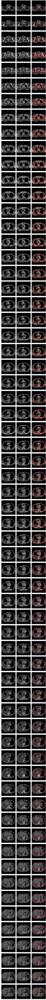

In [27]:
plot_img_label_pred((adjust_window(image,(700,200))*255).astype(np.uint8), label.astype(np.uint8), pred_t.numpy().astype(np.uint8), show_only_positive = True, interval =2)